In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import treecorr
import healpy as hp
import os

from importlib import reload

import somoclu

import time

start_time = time.time()

import sys
sys.path.append('src')

In [2]:
GETBACK=sys.path

In [3]:
current_path = os.getcwd()  # Obtiene el directorio actual
parent_path = os.path.dirname(current_path)  # Sube un nivel
os.chdir(parent_path)  # Cambia al directorio padre
sys.path = os.getcwd()

In [4]:
GETBACK2=sys.path

In [5]:
from matplotlib import cm
from matplotlib.patches import RegularPolygon
from mpl_toolkits.axes_grid1 import make_axes_locatable

In [6]:
catwo = pd.read_parquet("property_maps_desy3_small.parquet.gzip")
catwo = catwo.drop(['HPIX_4096','FOREGROUND_MASK','BADREGIONS_MASK','EBV_SFD98'], axis=1)
catwo = catwo.iloc[0:0]

In [7]:
sys.path=GETBACK2
os.chdir("Modulos")

In [8]:
MainArray = np.loadtxt("Main_Parmeters.txt")

In [9]:
som_dim = int(MainArray[0])
JoyDiv=int(MainArray[1])
dif=int(MainArray[2])
JD=int(MainArray[3])
SJ=int(MainArray[4])

In [10]:
del MainArray

In [11]:
bmu_x  = []
bmu_y  = []

with open("Modulo_SOM_BMUS.txt", "r") as file:
    for line in file:
        a, b = line.split()  
        bmu_x.append(int(b))  
        bmu_y.append(int(a))

Pix=np.array([bmu_y[i]*(som_dim+dif)+bmu_x[i] for i in range(len(bmu_x))]) 
del bmu_x
del bmu_y

In [12]:
current_path = os.getcwd()  # Obtiene el directorio actual
parent_path = os.path.dirname(current_path)  # Sube un nivel
os.chdir(parent_path)  # Cambia al directorio padre
sys.path = os.getcwd()

In [13]:
cat = pd.read_parquet("property_maps_desy3.parquet.gzip_rlkey=raykn68b2908fkvhhw9cpz2g8")
cat=cat[(cat['FOREGROUND_MASK']==0) & (cat['BADREGIONS_MASK']<=1) & (cat['FRACDET']>0.8)]
cat['Pixel_SOM'] = Pix

In [14]:
os.chdir("Modulos")
cat.to_parquet("property_maps_desy3PIX.parquet.gzip", engine="pyarrow", compression="gzip")

In [15]:
Cc = {}
for element in catwo.columns:
    grouped = cat.groupby('Pixel_SOM')[element]
    Density = grouped.sum() / grouped.count()
    Cc[element] = Density.reindex(range((som_dim+dif) * som_dim), fill_value=0)

In [16]:
cat=[]

In [17]:
SOM = np.loadtxt("Modulo_SOM_RESULTS.txt").reshape((som_dim+dif),som_dim,len(catwo.columns))

In [18]:
CL_Map = np.array([[[Cc[element].iloc[i * len(SOM[0]) + j] for element in catwo.columns]
                    for j in range(len(SOM[0]))]
                   for i in range(len(SOM))] ) 

In [19]:
from sklearn.cluster import AgglomerativeClustering
X = CL_Map.reshape(-1, CL_Map.shape[2])

clustering = AgglomerativeClustering(n_clusters=JoyDiv, linkage='ward') 
clustering.fit(X)

F=clustering.labels_.reshape(CL_Map.shape[1], CL_Map.shape[0])
F=F.T
F = F / (JoyDiv - 1)
CL_Map=[]

In [20]:
np.savetxt("Modulo_ClusteringBMUS.txt", clustering.labels_, fmt="%d")

In [21]:
sys.path=GETBACK

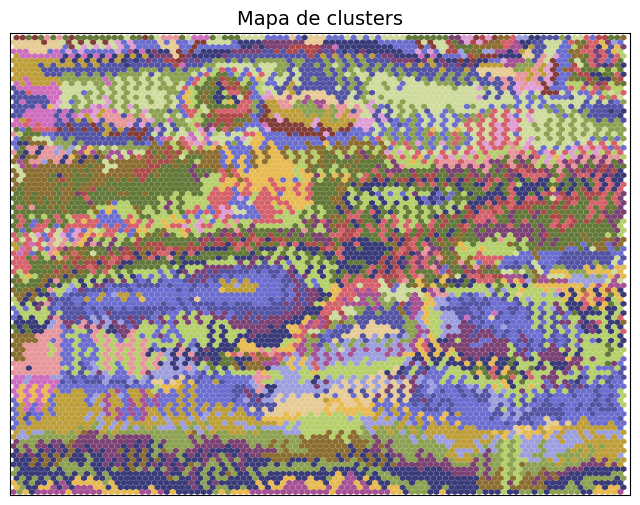

In [22]:
fig, ax = plt.subplots(figsize=(8, 6))
hex_size = 1

for i in range(F.shape[0]):
    for j in range(F.shape[1]):
        x = i * hex_size * np.sqrt(3) + (j % 2) * hex_size * np.sqrt(3) / 2
        y = j * hex_size * 3/2
        
        hexagon = RegularPolygon((x, y), numVertices=6, radius=hex_size, 
                                 orientation=np.radians(0),
                                 facecolor=plt.cm.tab20b(F[i, j]))
        ax.add_patch(hexagon)
        #ax.text(x, y, f'{F[i, j]*(JoyDiv-1):.1f}', ha='center', va='center', color='black', fontsize=8)

ax.set_ylim(-hex_size, F.shape[1] * hex_size * 3/2)
ax.set_xlim(-hex_size, F.shape[0] * hex_size * np.sqrt(3)+1)

ax.set_title('Mapa de clusters', fontsize=14)

plt.xticks([])
plt.yticks([])

plt.show()

In [23]:
CambF = np.array([int(clustering.labels_[Pix[i]]) for i in range(len(Pix))])

In [24]:
cat = pd.read_parquet("property_maps_desy3PIX.parquet.gzip")

In [25]:
cat["Group"] = CambF
cat.to_parquet("property_maps_desy3PIX.parquet.gzip", engine="pyarrow", compression="gzip")

In [26]:
Cc2 = {}
for element in catwo.columns:
    grouped = cat.groupby('Group')[element]
    Density = grouped.sum() / grouped.count()
    Cc2[element] = Density.reindex(range(JoyDiv))

del Density
del grouped

In [27]:
DS = pd.DataFrame()
for element in Cc2:
    DS_col=[]
    for i in range((som_dim + dif)*(som_dim)):
        DS_col=np.append(DS_col,Cc2[element][clustering.labels_[i]])
    DS[element] = DS_col

del  Cc2

DEPTH_MOF_G
DEPTH_MOF_I
DEPTH_MOF_R
DEPTH_MOF_Z
EBV_PLANCK13
FWHM_WMEAN_G
SKYVAR_UNCERTAINTY_G
EXPTIME_SUM_G
AIRMASS_WMEAN_G
FWHM_WMEAN_I
SKYVAR_UNCERTAINTY_I
EXPTIME_SUM_I
AIRMASS_WMEAN_I
FWHM_WMEAN_R
SKYVAR_UNCERTAINTY_R
EXPTIME_SUM_R
AIRMASS_WMEAN_R
FWHM_WMEAN_Z
SKYVAR_UNCERTAINTY_Z
EXPTIME_SUM_Z
AIRMASS_WMEAN_Z


/tmp/ipykernel_917/449934449.py:30: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(figsize=(8, 6))


NSTAR_GAIA_DR3
FRACDET


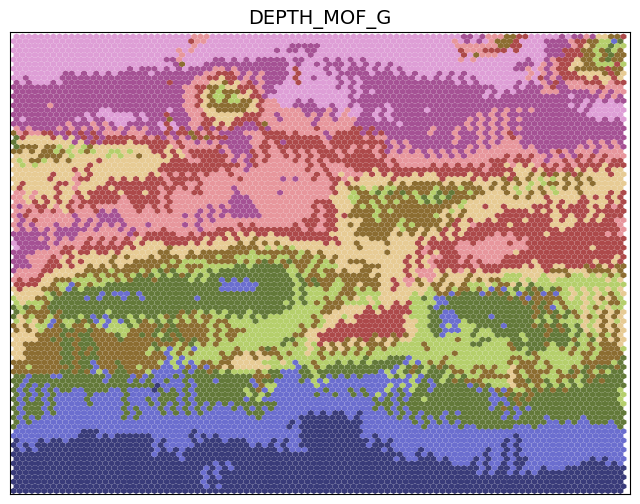

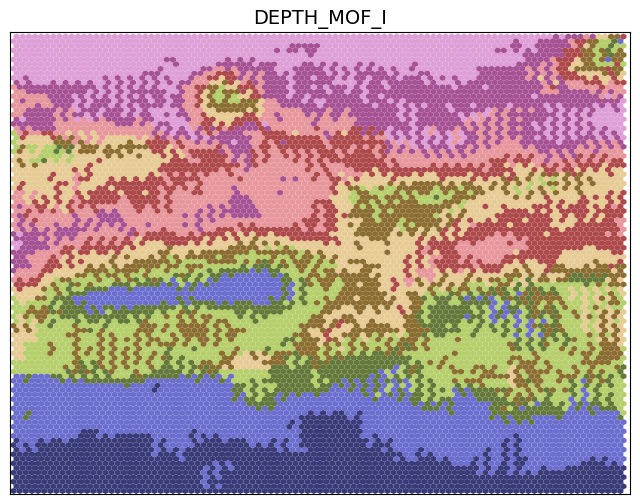

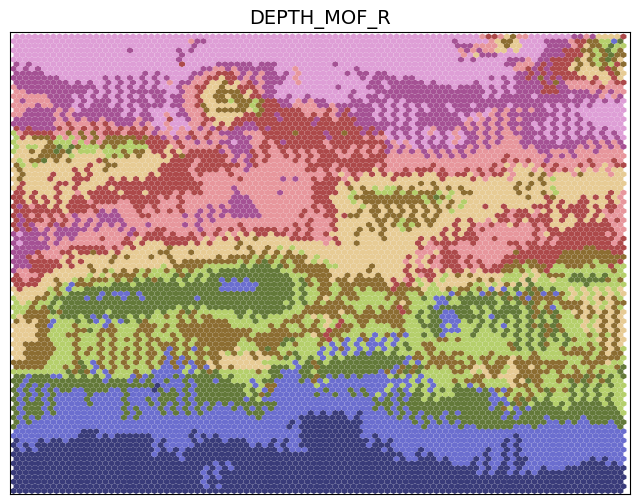

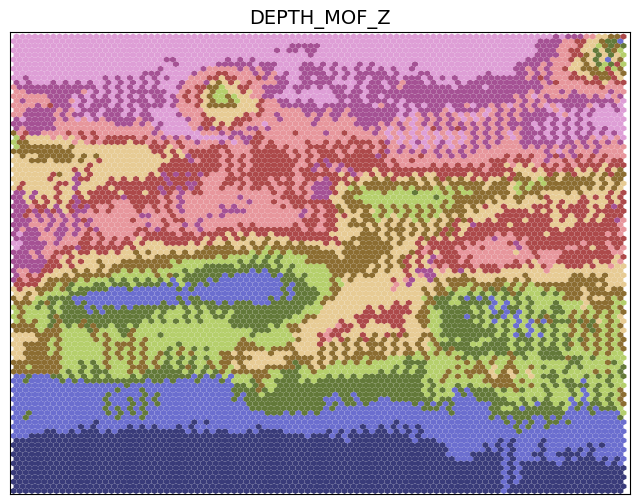

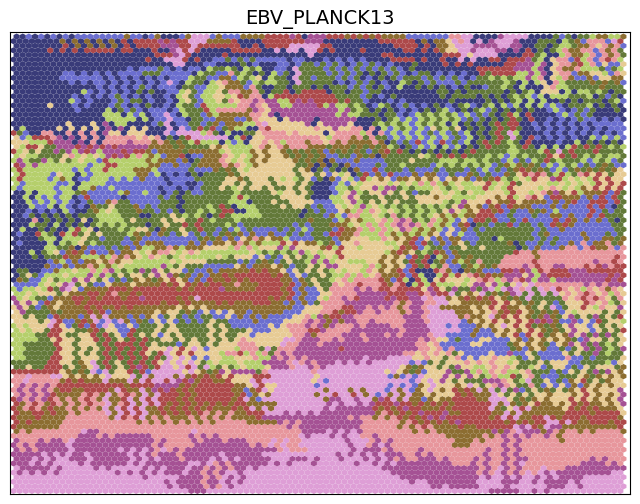

...

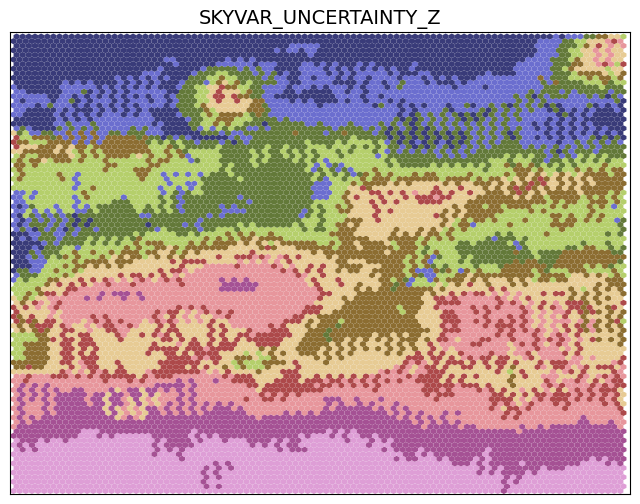

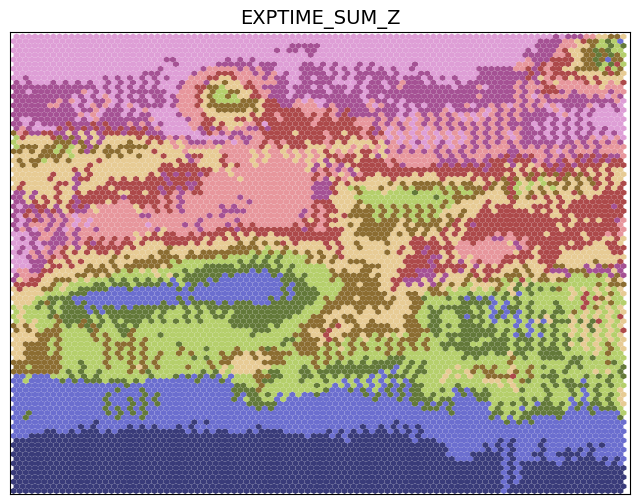

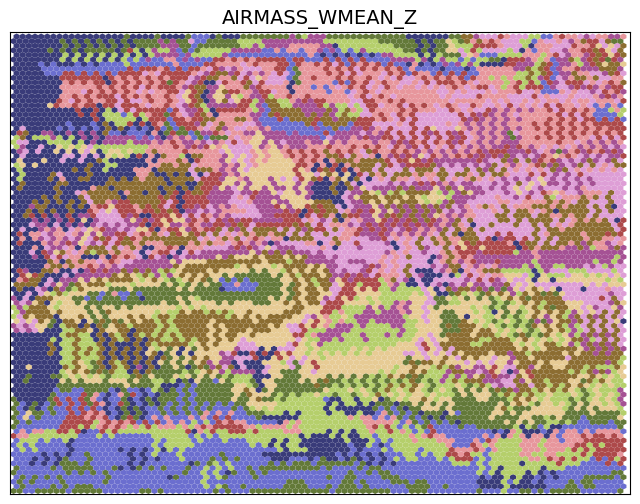

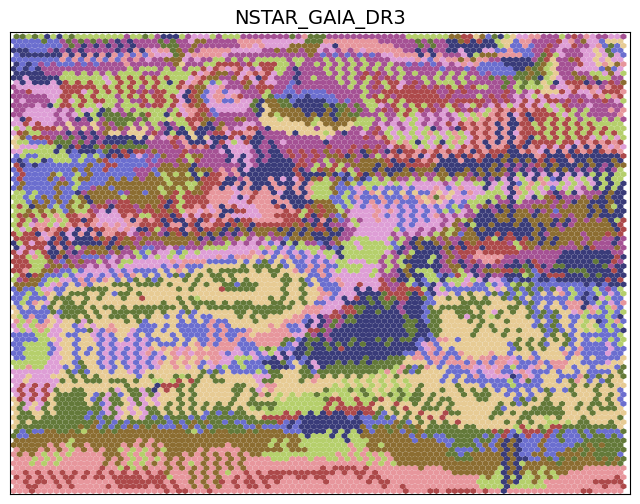

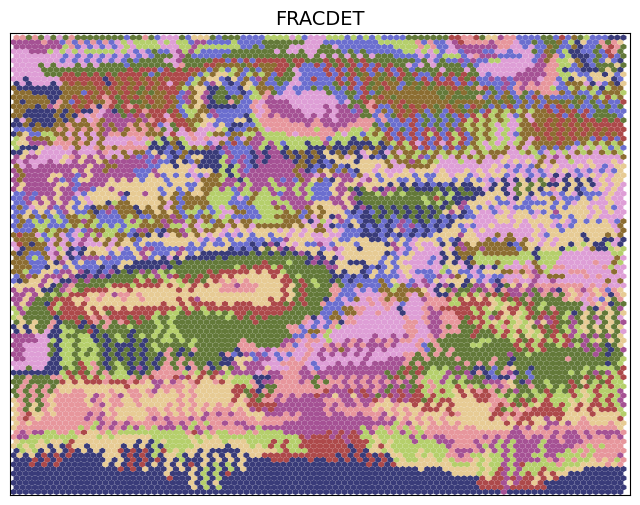

In [28]:
Elem_Clust=[]
CambF_=[]
for elem in DS.columns:
    print(elem)
    NewMap_= np.array([[[Cc[elem].iloc[i * len(SOM[0]) + j]]
                    for j in range(len(SOM[0]))]
                   for i in range(len(SOM))] )
    data = np.array(DS[elem])
    if np.isnan(data).any():
        data = data[~np.isnan(data)]  # Remover NaN
    if len(data) == 0:
        continue

    quantiles = np.quantile(data, np.linspace(0, 1, JD + 1))
    percentile_labels = np.digitize(data, quantiles[1:-1], right=True)
    RealCounter=0
    UltimateArray=[]
    for i in range(len(DS[elem])):
        if np.isnan(DS[elem][i]):
            UltimateArray.append(np.nan)
        else:
            UltimateArray.append(percentile_labels[RealCounter]) 
            RealCounter+=1
    flag=UltimateArray
    F_=np.array(UltimateArray).reshape(NewMap_.shape[1], NewMap_.shape[0])
    F_=F_.T
    F_ = F_ / (JD- 1)
    Elem_Clust.append(flag)
    CambF_ .append(np.array([int(UltimateArray[Pix[i]]) for i in range(len(Pix))]))
    fig, ax = plt.subplots(figsize=(8, 6))
    hex_size = 1
    
    for i in range(F_.shape[0]):
        for j in range(F_.shape[1]):
            x = i * hex_size * np.sqrt(3) + (j % 2) * hex_size * np.sqrt(3) / 2
            y = j * hex_size * 3/2
            
            hexagon = RegularPolygon((x, y), numVertices=6, radius=hex_size, 
                                     orientation=np.radians(0),
                                     facecolor=plt.cm.tab20b(F_[i, j]))
            ax.add_patch(hexagon)
            #ax.text(x, y, f'{F_[i, j]*(JD-1):.1f}', ha='center', va='center', color='black', fontsize=8)
    
    ax.set_ylim(-hex_size, F_.shape[1] * hex_size * 3/2)
    ax.set_xlim(-hex_size, F_.shape[0] * hex_size * np.sqrt(3)+1)
    
    ax.set_title(elem, fontsize=14)
    
    plt.xticks([])
    plt.yticks([])
    
plt.show()

In [29]:
del Pix
del Cc
del NewMap_
del F_
del Elem_Clust
del UltimateArray

In [30]:
Cat= pd.DataFrame()

In [31]:
Cat["HPIX_4096"]=cat["HPIX_4096"]
Cat['Group']=cat['Group']
del cat

In [32]:
for num, elem in enumerate(catwo.columns):
    Cat["Group_"+elem] = CambF_[num]

In [33]:
#os.chdir("Modulos")
Cat.to_parquet("property_maps_desy3Groups.parquet.gzip", engine="pyarrow", compression="gzip")